In [34]:
# ignore warnings
import warnings
warnings.filterwarnings('ignore')

# import pandas
import pandas as pd

# import matplotlib
import matplotlib.pyplot as plt

from matplotlib import pyplot

# import prophet
from prophet import Prophet

In [26]:
# load data
wmt = pd.read_csv('https://raw.githubusercontent.com/gumdropsteve/intro_to_prophet/master/data/WMT.csv')

* Explore the dataset

In [27]:
wmt

,Date,Open,High,Low,Close,Adj Close,Volume
0,1972-08-25,0.063477,0.064697,0.063477,0.064453,0.023768,2508800
1,1972-08-28,0.064453,0.064941,0.064209,0.064209,0.023678,972800
2,1972-08-29,0.063965,0.063965,0.063477,0.063477,0.023408,1945600
3,1972-08-30,0.063477,0.063477,0.062988,0.063477,0.023408,409600
4,1972-08-31,0.062988,0.062988,0.062500,0.062500,0.023047,870400
...,...,...,...,...,...,...,...
11810,2019-06-26,110.849998,111.080002,110.099998,110.160004,110.160004,4161700
11811,2019-06-27,110.059998,110.510002,108.860001,110.099998,110.099998,5481300
11812,2019-06-28,110.550003,111.510002,110.239998,110.489998,110.489998,6506700
11813,2019-07-01,111.300003,111.970001,110.019997,110.620003,110.620003,5514700


* use only `Date` and `Adj Close` columns

In [28]:
df = wmt.drop(columns = ['Open','High','Low','Close','Volume'])
df

,Date,Adj Close
0,1972-08-25,0.023768
1,1972-08-28,0.023678
2,1972-08-29,0.023408
3,1972-08-30,0.023408
4,1972-08-31,0.023047
...,...,...
11810,2019-06-26,110.160004
11811,2019-06-27,110.099998
11812,2019-06-28,110.489998
11813,2019-07-01,110.620003


* rename columns to fit Prophet naming convention

In [29]:
df = df.rename(columns={"Date": "ds", "Adj Close": "y"})
df

,ds,y
0,1972-08-25,0.023768
1,1972-08-28,0.023678
2,1972-08-29,0.023408
3,1972-08-30,0.023408
4,1972-08-31,0.023047
...,...,...
11810,2019-06-26,110.160004
11811,2019-06-27,110.099998
11812,2019-06-28,110.489998
11813,2019-07-01,110.620003


* convert date to datetime

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11815 entries, 0 to 11814
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ds      11815 non-null  object 
 1   y       11815 non-null  float64
dtypes: float64(1), object(1)
memory usage: 184.7+ KB


In [31]:
df['ds'] = pd.to_datetime(df['ds'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11815 entries, 0 to 11814
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      11815 non-null  datetime64[ns]
 1   y       11815 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 184.7 KB


* plot time-series

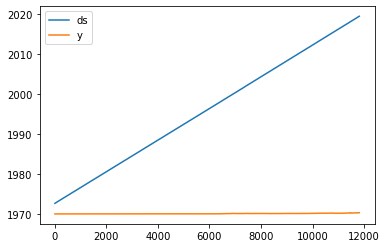

In [35]:
df.plot()
pyplot.show()

* instantiate Prophet

In [37]:
m = Prophet()

* fit model

In [38]:
m.fit(df)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


* forecast 365 values in future 

In [39]:
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
12175,2020-06-27
12176,2020-06-28
12177,2020-06-29
12178,2020-06-30
12179,2020-07-01


* plot forecast

In [40]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
12175,2020-06-27,96.535029,90.966454,101.442080
12176,2020-06-28,96.537783,91.666004,101.480923
12177,2020-06-29,96.510731,91.435405,101.428818
12178,2020-06-30,96.531377,91.578049,101.033115
12179,2020-07-01,96.520955,91.702079,101.470532


* plot components

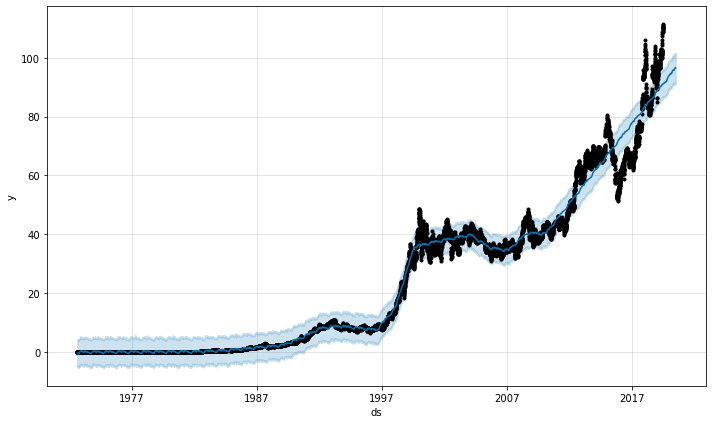

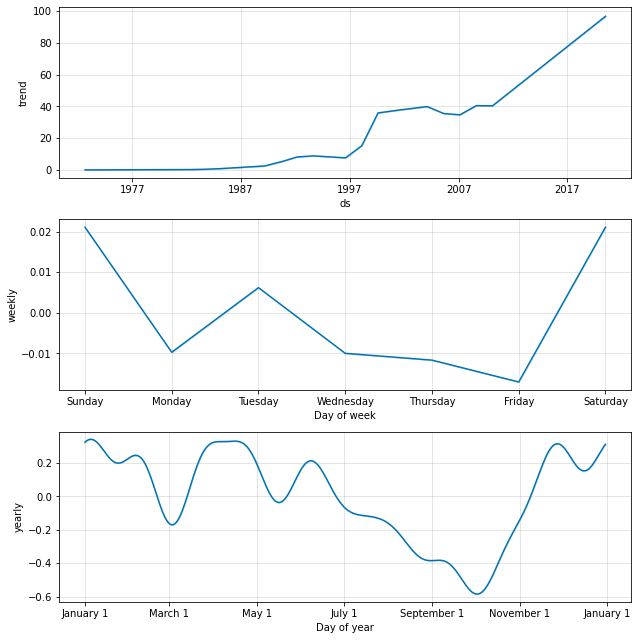

In [41]:
fig1 = m.plot(forecast)
fig2 = m.plot_components(forecast)

In [42]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [43]:
plot_components_plotly(m, forecast)